### Visualizing Model Outputs

In [9]:
import pandas as pd
import numpy as np
from numpy import inf
import os
import matplotlib.style as style
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from pandas.plotting import register_matplotlib_converters

np.seterr(divide = 'ignore') 
pd.options.mode.chained_assignment = None
register_matplotlib_converters()
%matplotlib inline


In [10]:
all_data = pd.read_pickle('.\\..\\data\\covid_df.pkl')
output = pd.read_pickle('.\\..\\data\\predictions_log_total.pkl')

In [11]:
mlp = pd.read_pickle('.\\..\\data\\mlp_predictions.pkl')

In [12]:
death_strict = pd.read_pickle('.\\..\\predictions\\deaths_rf_max_stringency.pkl')
death_lax =pd.read_pickle('.\\..\\predictions\\deaths_rf_min_stringency.pkl')

In [13]:
death_strict.head(3)

,Afghanistan real,Afghanistan prediction,Albania real,Albania prediction,Algeria real,Algeria prediction,Angola real,Angola prediction,Argentina real,Argentina prediction,...,Venezuela real,Venezuela prediction,Vietnam real,Vietnam prediction,Yemen real,Yemen prediction,Zambia real,Zambia prediction,Zimbabwe real,Zimbabwe prediction
date,,,,,,,,,,,,,,,,,,,,,
2020-05-20,187.0,174.92,31.0,43.77,568.0,540.82,3.0,16.26,403.0,365.42,...,10.0,63.68,0.0,14.69,30.0,24.85,7.0,14.73,4.0,6.54
2020-05-21,193.0,166.91,31.0,44.17,575.0,497.38,3.0,20.64,416.0,354.58,...,10.0,106.57,0.0,14.69,33.0,22.75,7.0,17.07,4.0,8.17
2020-05-22,NaN,NaN,31.0,43.96,582.0,457.20,3.0,24.52,433.0,347.65,...,10.0,182.28,0.0,14.69,33.0,20.73,7.0,20.02,4.0,12.40


In [14]:
death_lax.head(3)

,Afghanistan real,Afghanistan prediction,Albania real,Albania prediction,Algeria real,Algeria prediction,Angola real,Angola prediction,Argentina real,Argentina prediction,...,Venezuela real,Venezuela prediction,Vietnam real,Vietnam prediction,Yemen real,Yemen prediction,Zambia real,Zambia prediction,Zimbabwe real,Zimbabwe prediction
date,,,,,,,,,,,,,,,,,,,,,
2020-05-20,187.0,149.91,31.0,31.57,568.0,515.42,3.0,7.66,403.0,372.54,...,10.0,142.14,0.0,13.36,30.0,23.10,7.0,10.00,4.0,4.88
2020-05-21,193.0,142.12,31.0,31.94,575.0,473.34,3.0,14.00,416.0,360.25,...,10.0,183.67,0.0,13.36,33.0,21.03,7.0,10.59,4.0,5.21
2020-05-22,NaN,NaN,31.0,31.73,582.0,433.38,3.0,18.27,433.0,351.90,...,10.0,257.43,0.0,13.36,33.0,19.44,7.0,13.24,4.0,6.70


In [15]:
side_by_side(all_data, 'Spain', 'Deaths', ['Random Forest (Lax)', 'Random Forest (Strict)'], 
             death_lax, death_strict, save_output=False, 
             suptitle='Policy Comparison: Strict transport closure vs Lax transport closure')

NameError: name 'side_by_side' is not defined

Linear Regression
Neural Network


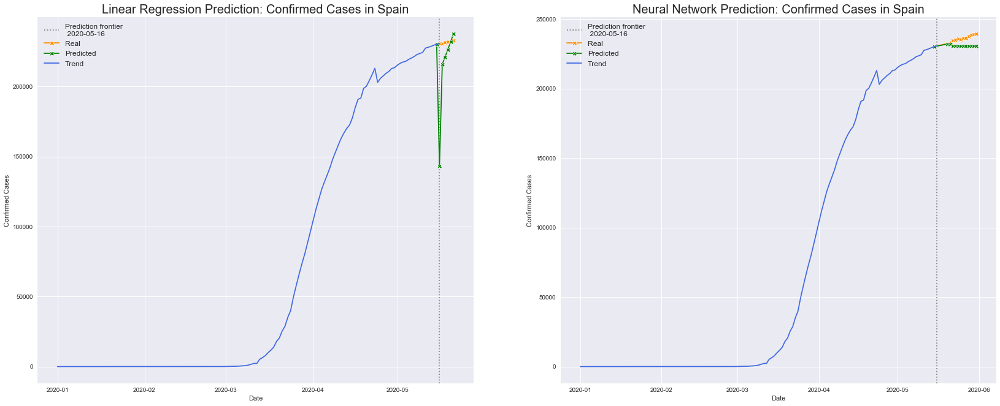

In [18]:
def predicted_vs_real(full_df, output_df, country, target, logged=False, net=False):
    '''
    Plots one model's prediction vs real trend
    '''
    style.use('seaborn')
    date = output_df.index.min()
    pre = full_df[(full_df['Country'] == country) & (full_df['Date'] <= date)][[target, 'Date']]
    real = country + ' real'
    predict = country + ' prediction'
    post = output_df[[real, predict]]  
    day = pre['Date'].max() + dt.timedelta(days=-1)
    row = pre[pre['Date'] == day][[target, 'Date']]
    val = row[target]
    if logged:
        row[real], row[predict] = (np.log(val), np.log(val))
    else:
        row[real], row[predict] = (val, val)
    row.set_index('Date', inplace=True)
    post = row.append(post[[real, predict]])
    if logged:
        post = np.exp(post)
        
    fig, ax = plt.subplots(figsize=(12, 8))
    title = 'Prediction: {} in {}'.format(target, country)
    if net:
        title = 'Neural Net ' + title
    else:
        title = 'Linear Regression ' + title
    plt.title(label=title, fontsize=15)
    ax.axvline(x=date, ls=':', c='gray', label = str(date))
    g = sns.lineplot(x=post.index, y=post[real], ax=ax, marker='X', color='darkorange')
    g = sns.lineplot(x=post.index, y=post[predict], ax=ax, marker='X', color='g')
    g = sns.lineplot(x=pre['Date'], y=pre[target], ax=ax, color='royalblue')
    plt.legend(('Prediction frontier\n {}'.format(date), 'Real', 'Predicted', 'Trend'), prop={'size': 12})
    plt.ylabel(target)
    plt.show()

    
def side_by_side(full_df, country, target, models, *predictions, save_output=False, suptitle=None):
    '''
    Plots two different plots of models' predictions vs real trends side by side. 
    --first *predictions arg must be the one to be logged (LinReg)
    Inputs:
        full_df: (Pandas df) The full cleaned dataset
        country: (string) Country to examine
        target: (string) the outcome variable of the model
        models: (list) model names as strings
        *predictions: (tuple of Pandas df) collection of model prediction data
        save_output: (boolean) switch to save image output
    Output:
        File if save_output=True
        plots figure
    '''
    np.seterr(all='ignore')
    style.use('seaborn')
    date = predictions[0].index.min()
    pre = full_df[(full_df['Country'] == country) & (full_df['Date'] <= date)][[target, 'Date']]
    real, predict = (country + ' real', country + ' prediction')
    day = pre['Date'].max() + dt.timedelta(days=-1)
    fig, axes = plt.subplots(1, 2, figsize=(28,11))
    title = ' Prediction: {} in {}'.format(target, country)
    post_trends = []
    #y_max = pre[target].dropna().values.max()
    
    for pred, model in zip(predictions, models):
        print(model)
        post = pred[[real, predict]]
        row = pre[pre['Date'] == day][[target, 'Date']]
        row.set_index('Date', inplace=True)
        val = row[target]
        if model == 'Linear Regression':
            row[real], row[predict] = (np.log(val), np.log(val))
            post = np.exp(row.append(post[[real, predict]]))
        else:
            row[real], row[predict] = (val, val) 
            post = row.append(post[[real, predict]])
        post_trends.append(post)
    iterable = zip(models, predictions, axes, post_trends)
    for model, output, axis, trend in iterable:
        sub_title = model + title
        axis.set_title(sub_title, fontsize=20)
        axis.axvline(x=date, ls=':', c='gray', label = str(date))
        g = sns.lineplot(x=trend.index, y=trend[real], ax=axis, marker='X', color='darkorange')
        g = sns.lineplot(x=trend.index, y=trend[predict], ax=axis, marker='X', color='g')
        g = sns.lineplot(x=pre['Date'], y=pre[target], ax=axis, color='royalblue')
        axis.legend(('Prediction frontier\n {}'.format(date), 'Real', 'Predicted', 'Trend'), prop={'size': 12})
        plt.ylabel(target)    
        #if output[[real, predict]].dropna().values.max() > y_max:
            #y_max = output[[real, predict]].dropna().values.max()
    #plt.ylim(0, y_max + y_max*.15)
    if save_output:
        file_name = '{} {} {} comparison.png'.format(country, *models)
        plt.savefig('.\\..\\visualizations\\' + file_name)
    if suptitle:
        plt.suptitle(suptitle, fontsize=21)
    plt.show()

#predicted_vs_real(all_data, mlp, 'Spain', 'Confirmed Cases', logged=False, net=True)

side_by_side(all_data, 'Spain', 'Confirmed Cases', ['Linear Regression', 'Neural Network'], output, mlp, save_output=True)

In [ ]:

side_by_side(all_data, 'Austria', 'Confirmed Cases', ['Linear Regression', 'Neural Network'],death_lax, death_strict, save_output=True)
side_by_side(all_data, 'Kenya', 'Confirmed Cases', ['Linear Regression', 'Neural Network'],output, mlp, save_output=True)

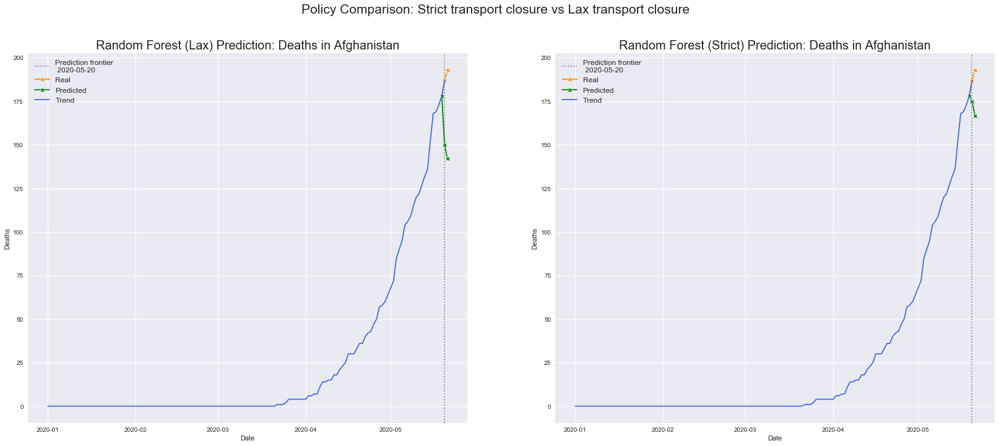

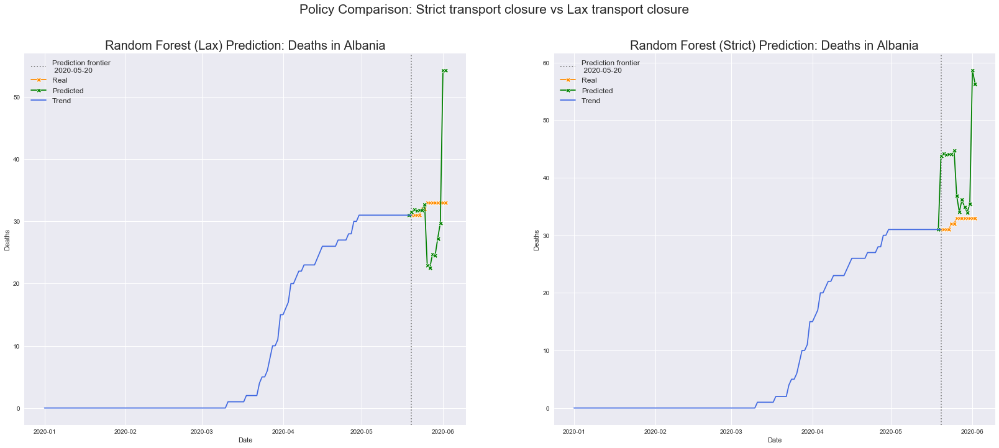

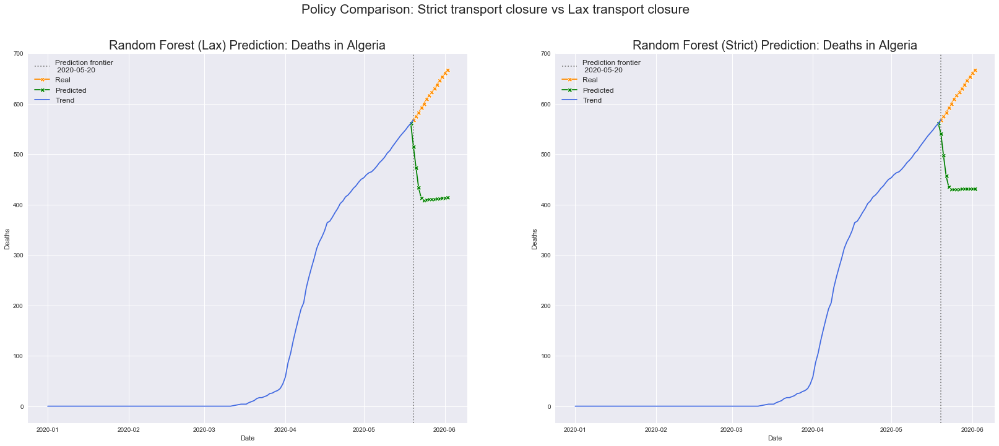

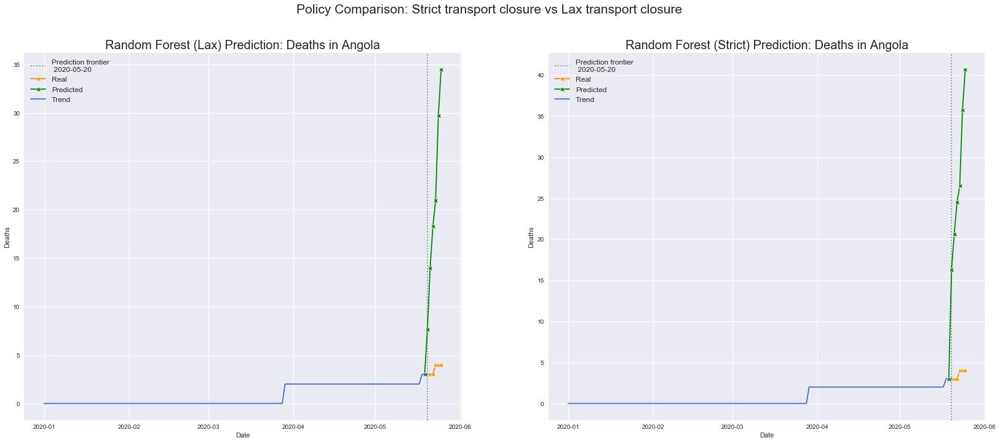

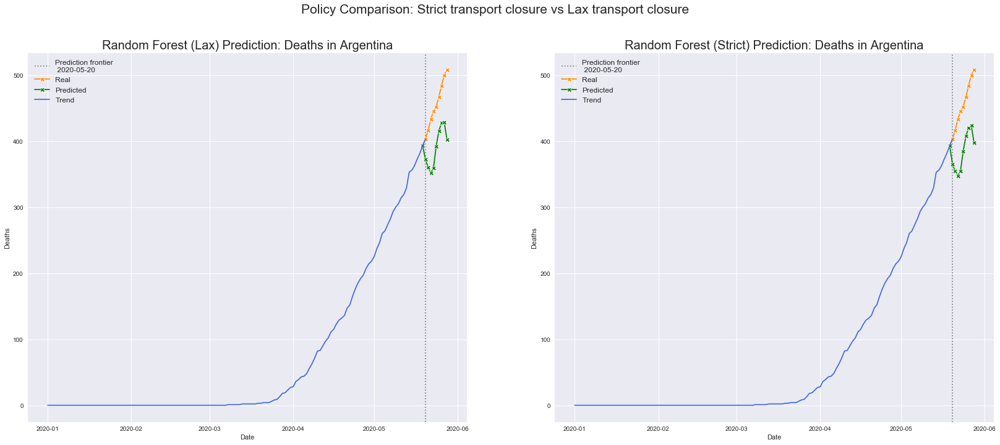

...

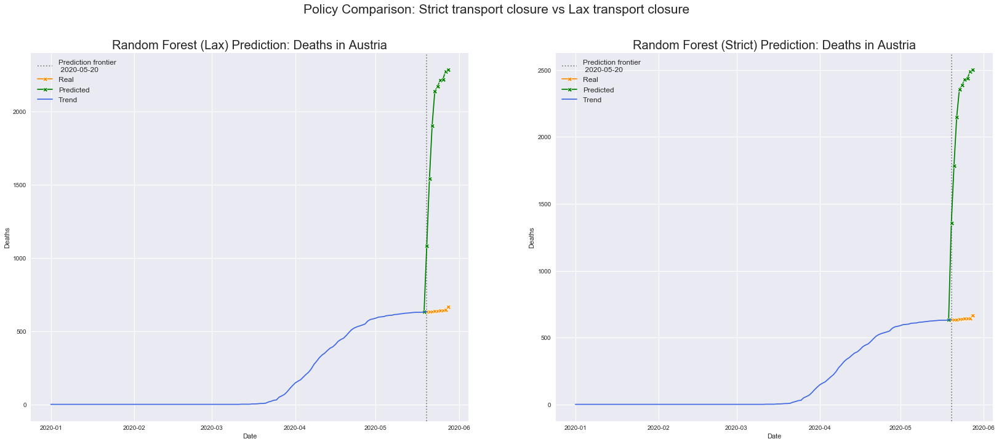

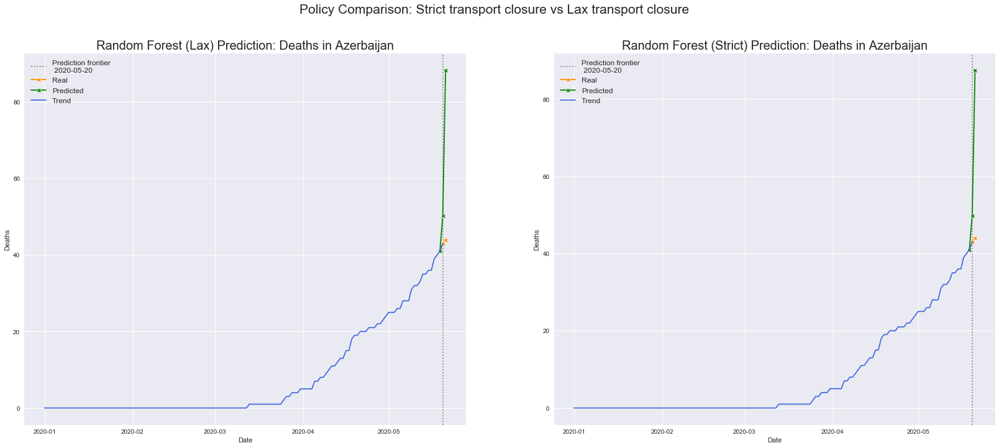

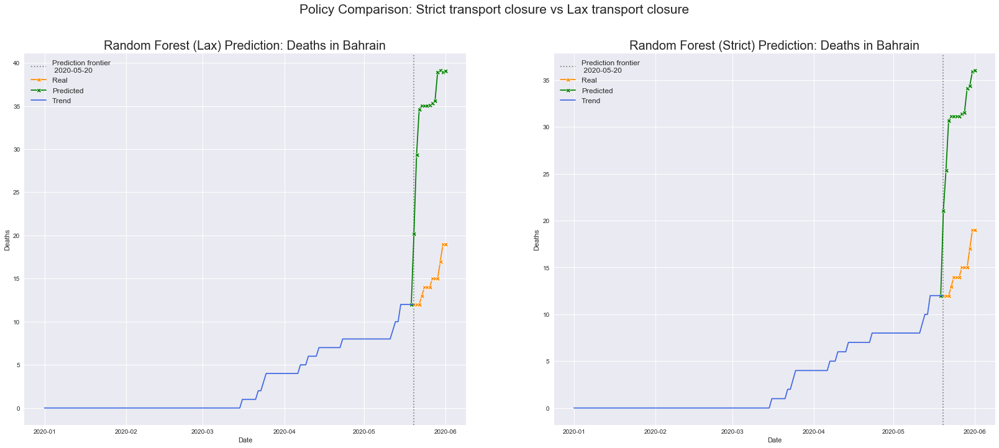

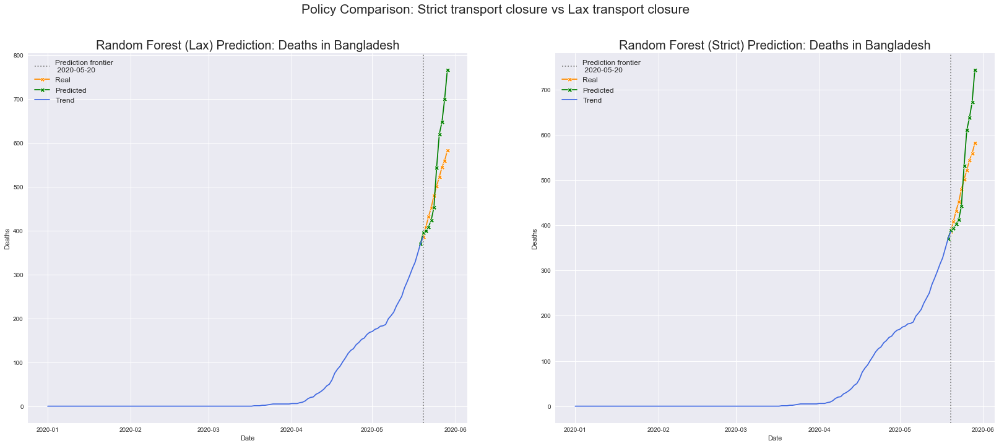

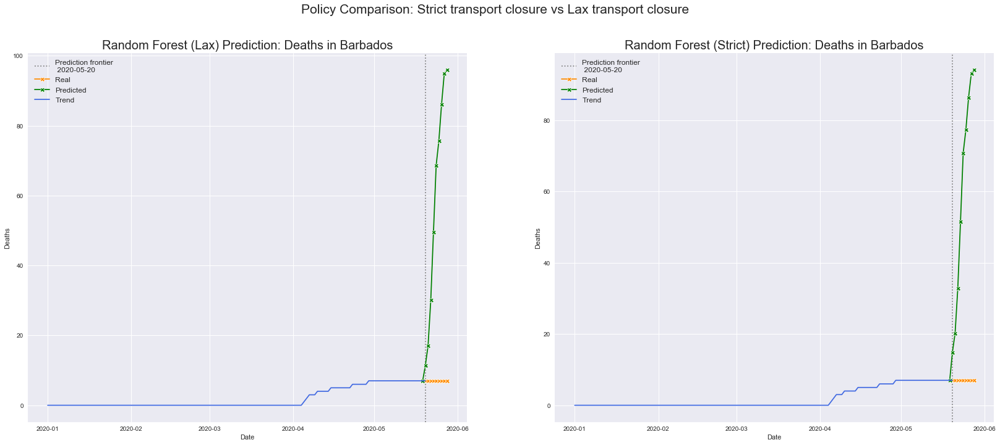

country missing: Belarus 





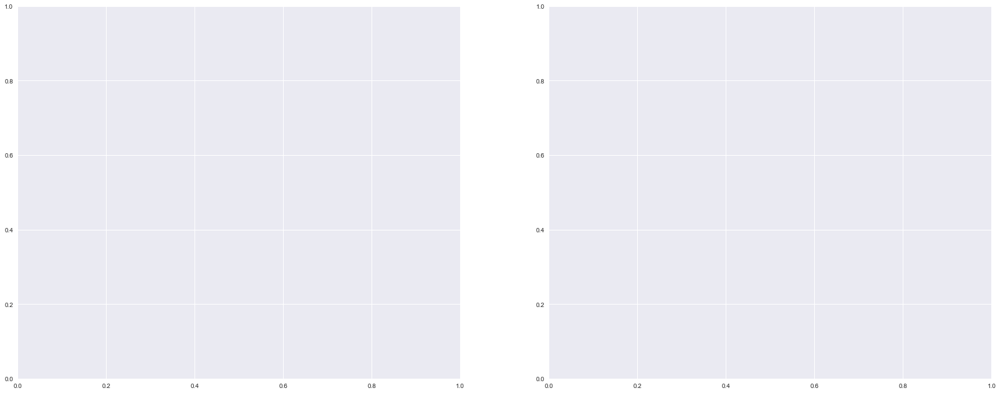

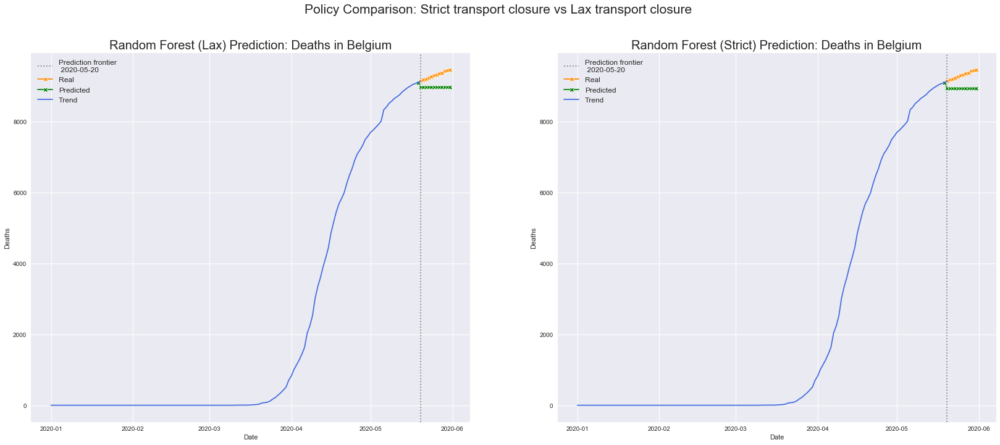

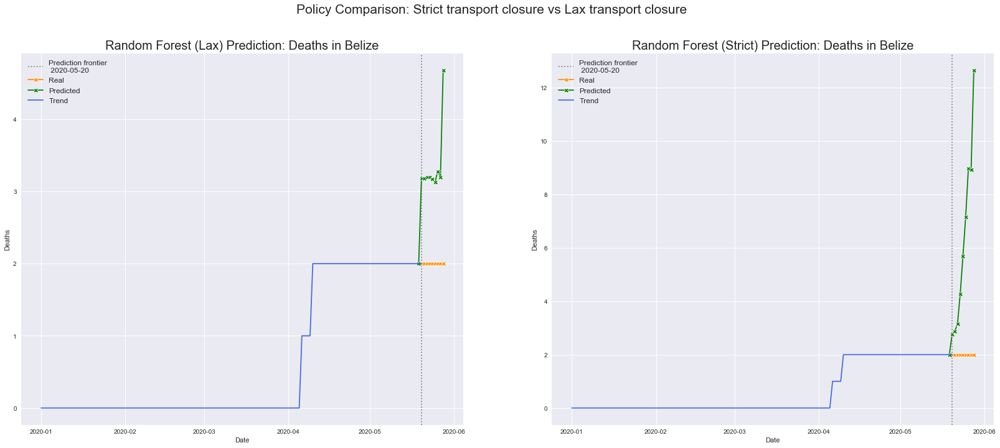

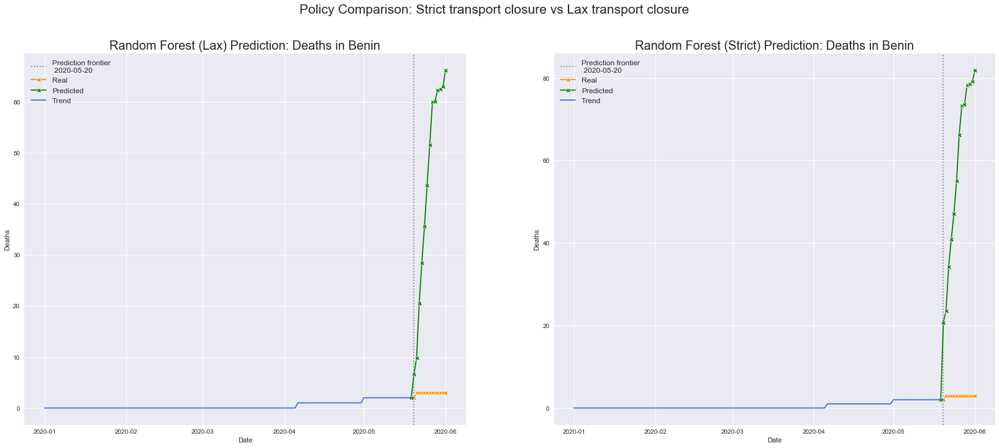

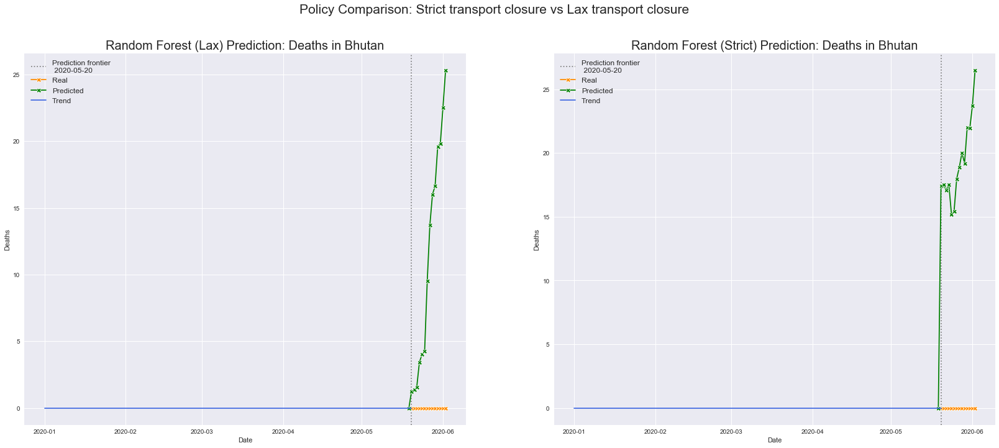

...

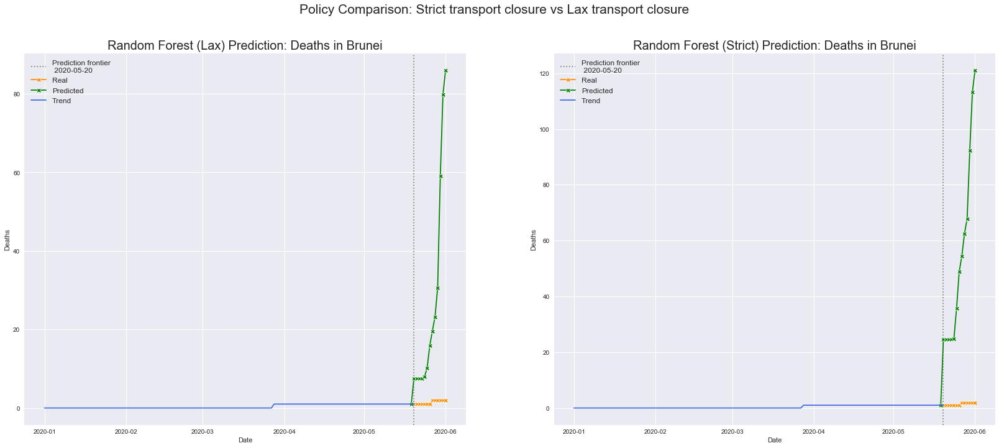

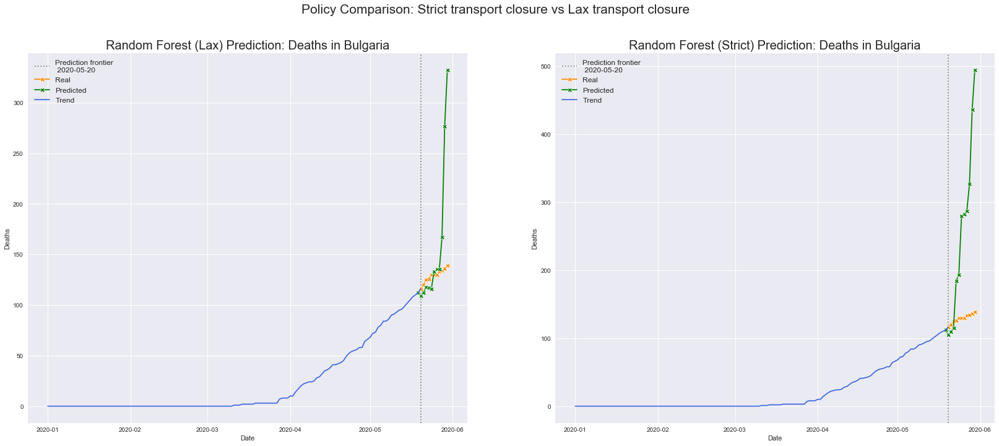

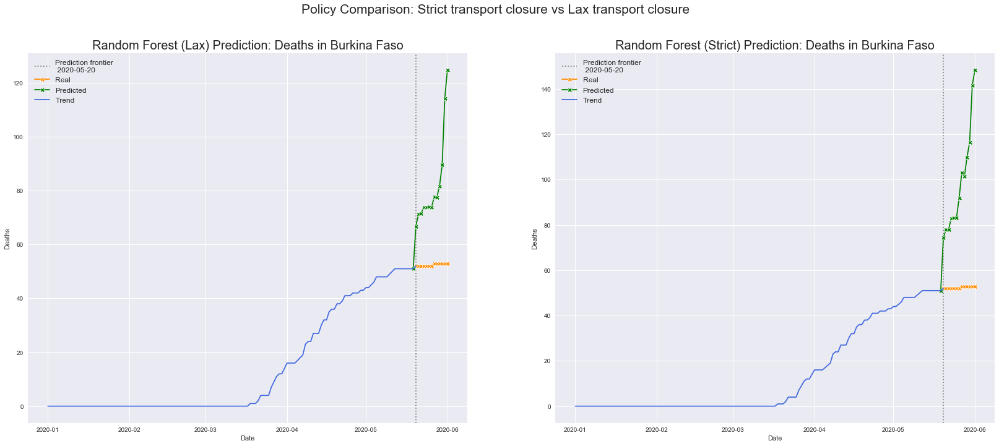

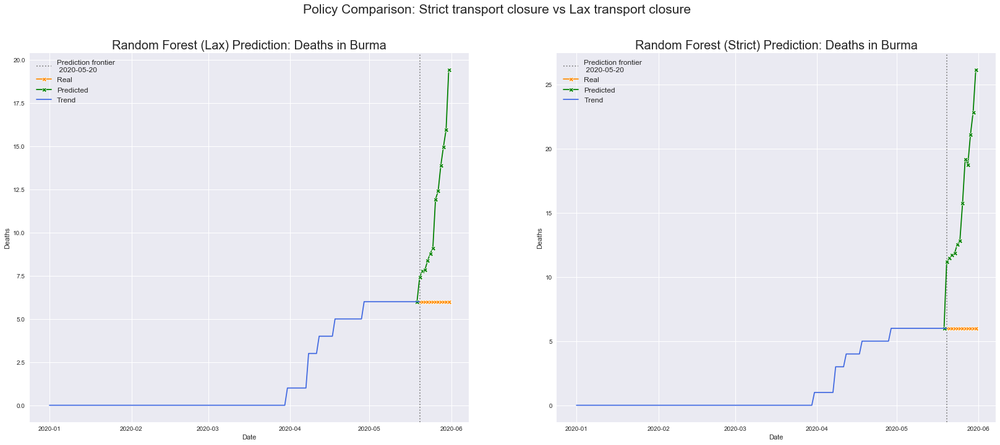

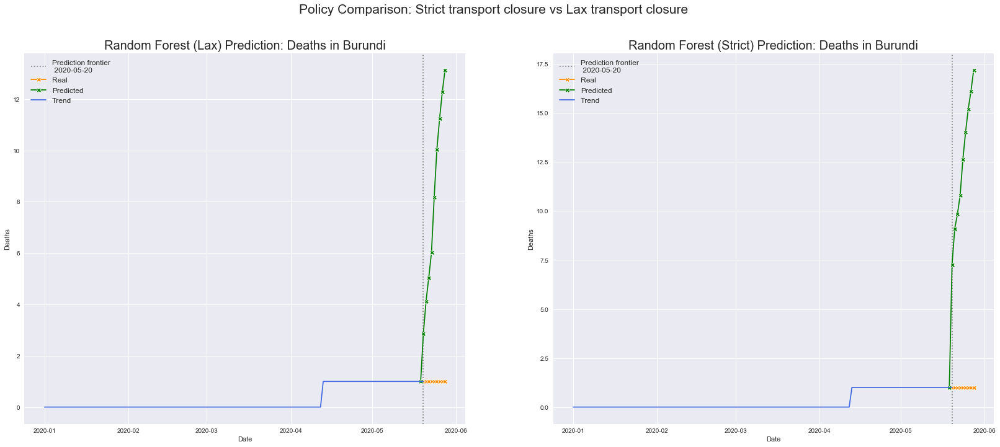

country missing: Cambodia 





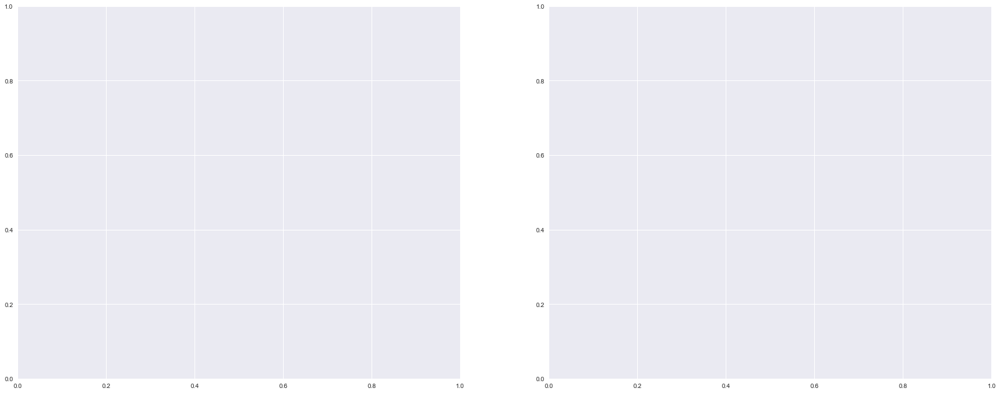

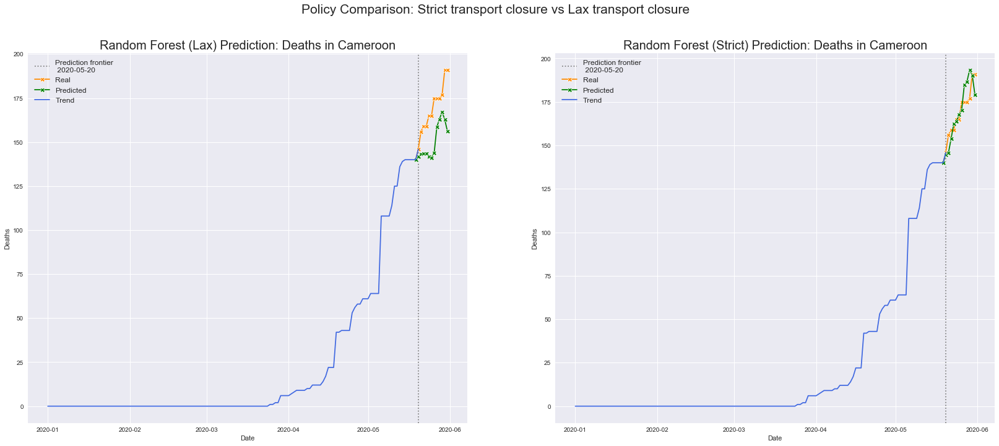

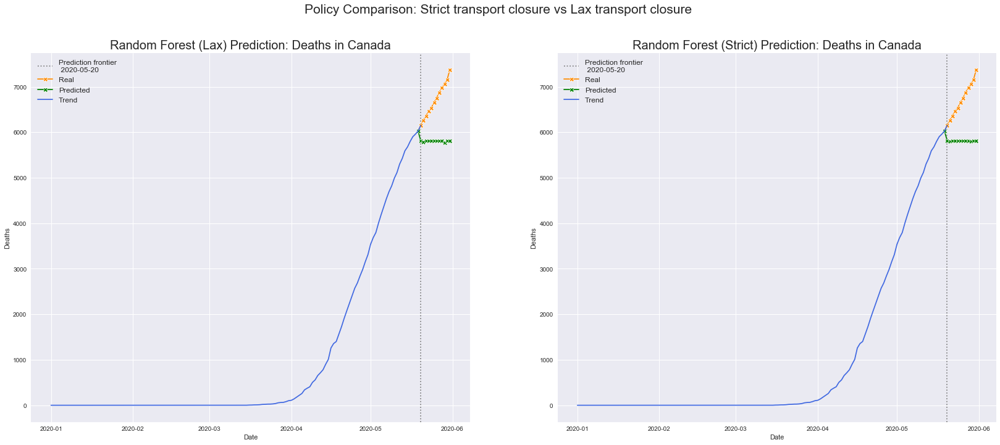

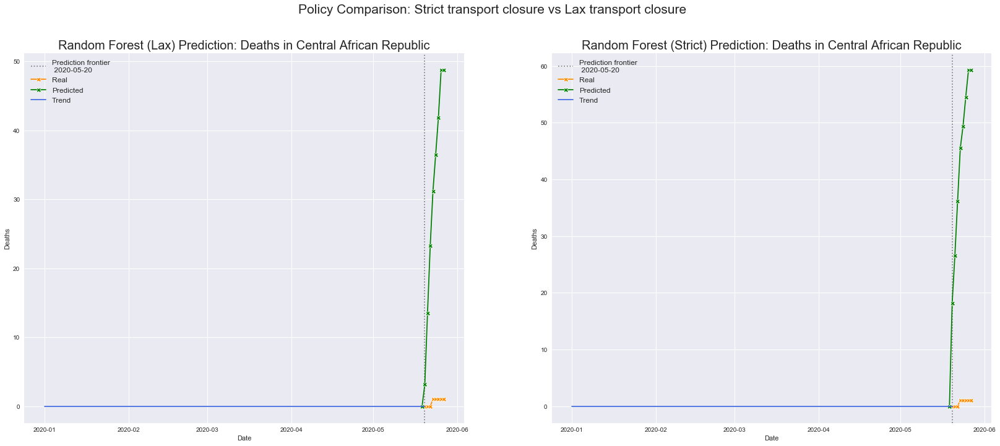

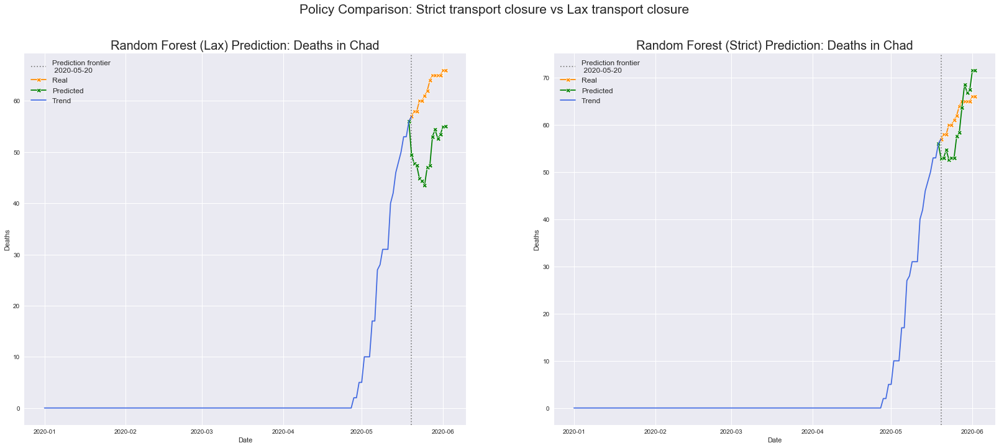

...

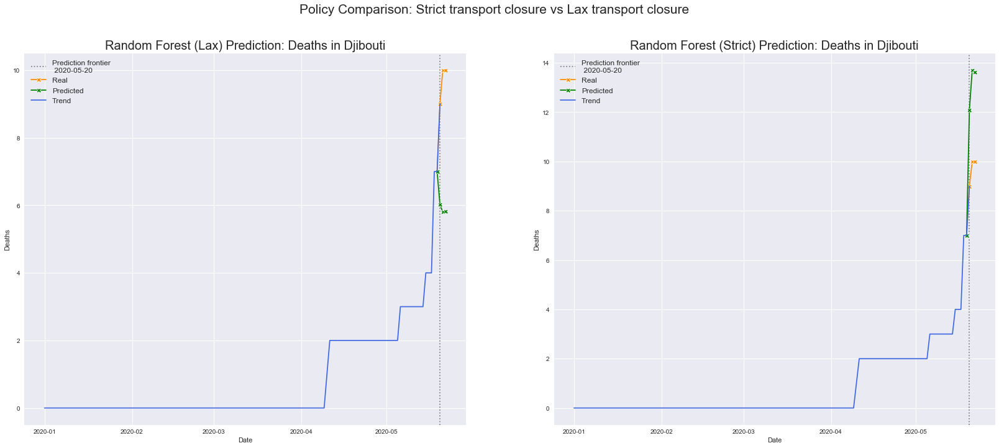

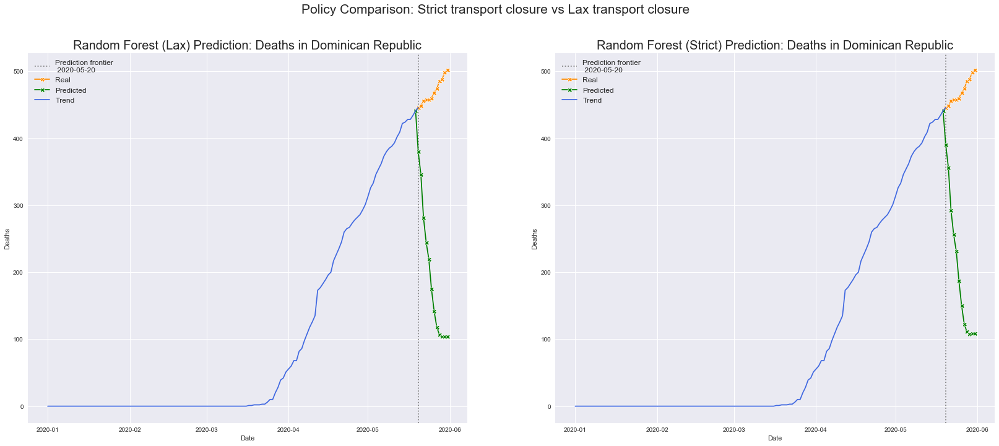

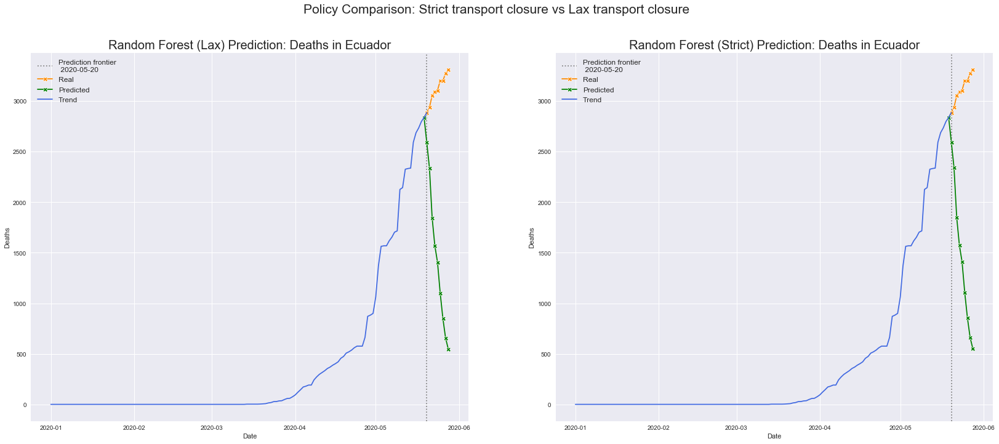

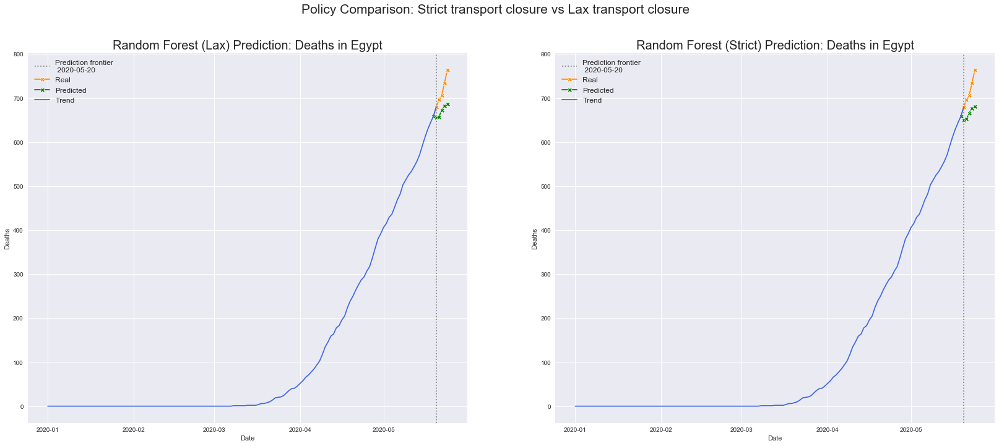

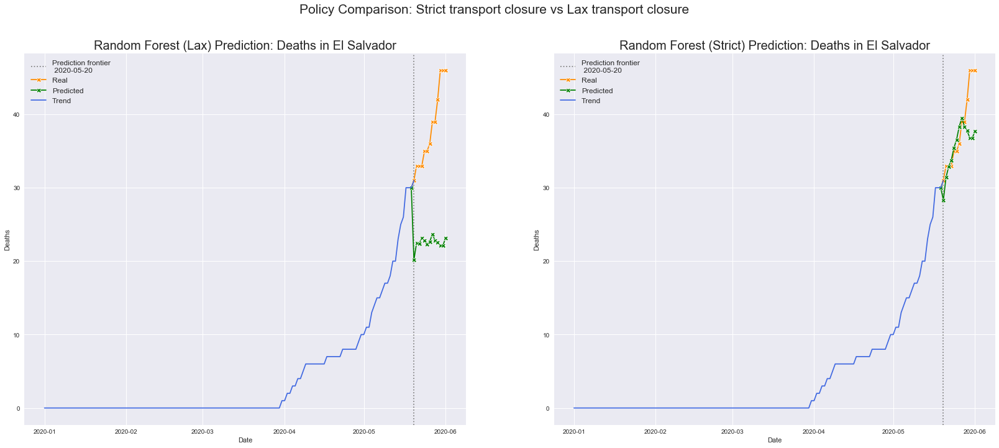

country missing: Eritrea 





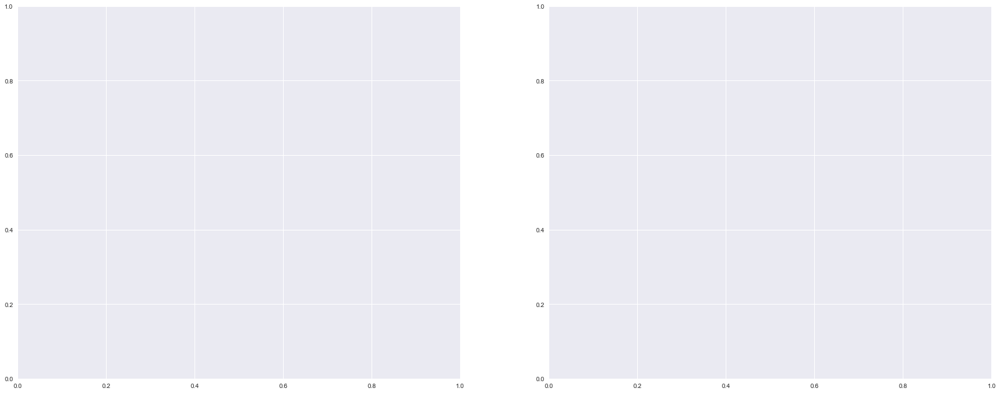

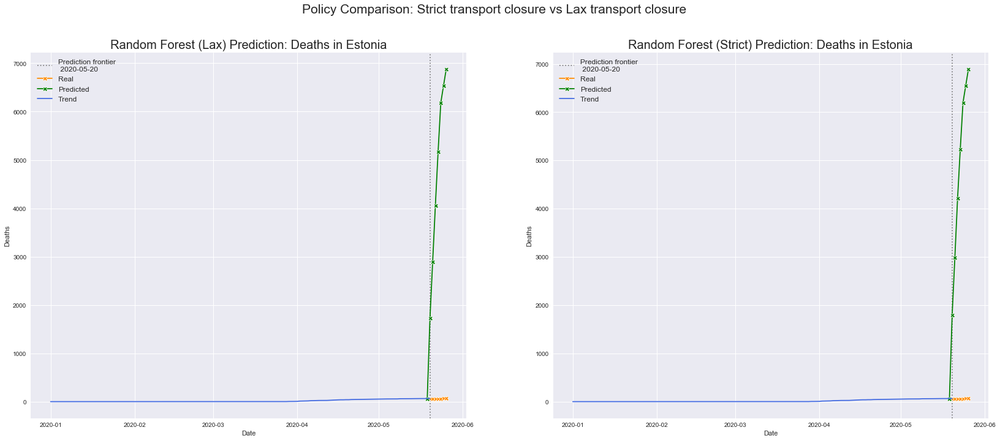

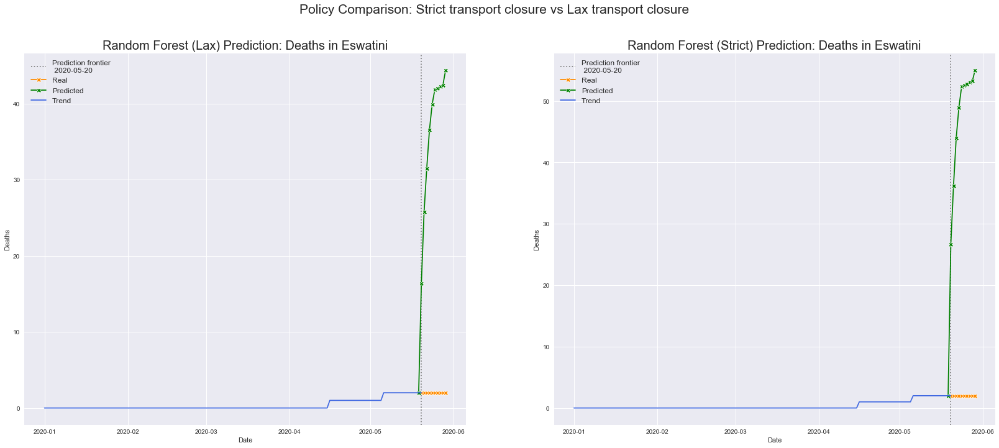

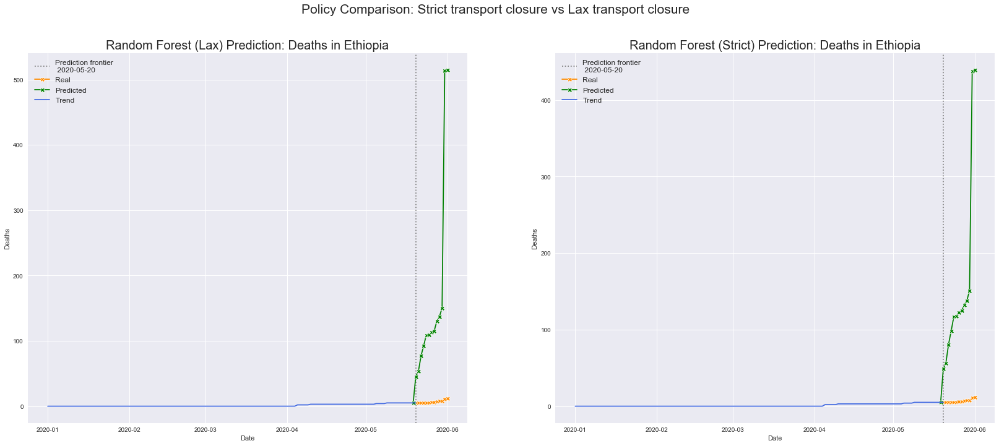

country missing: Fiji 





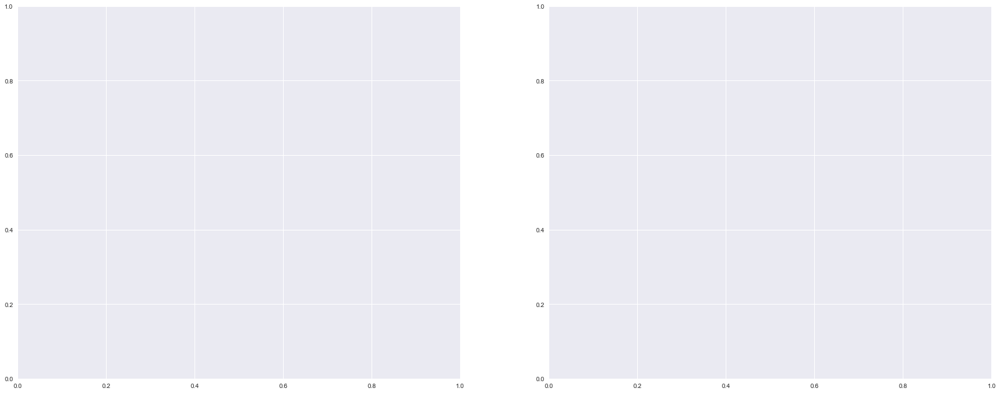

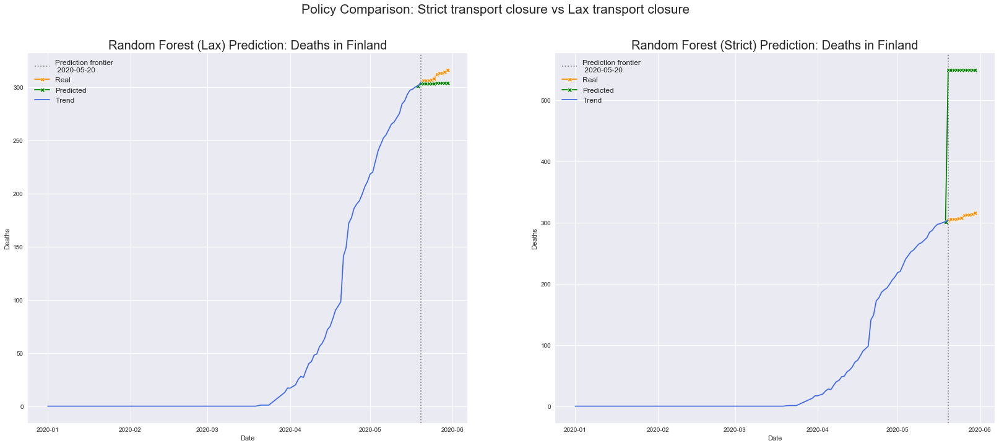

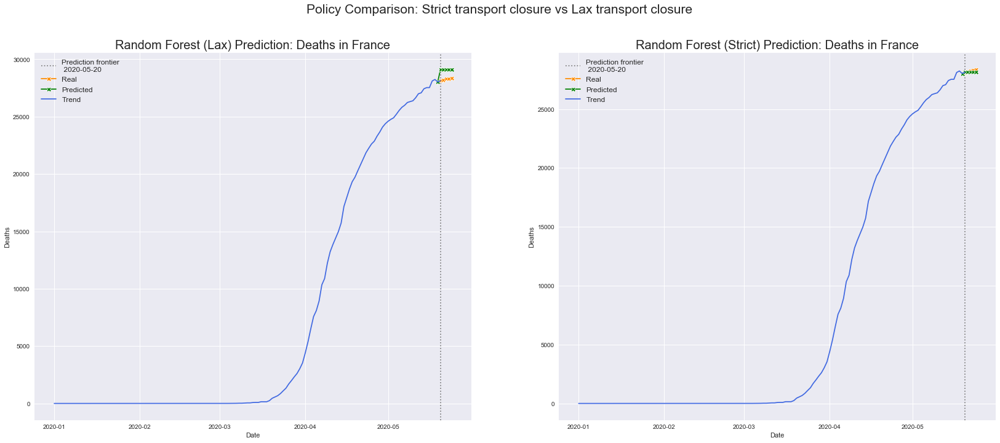

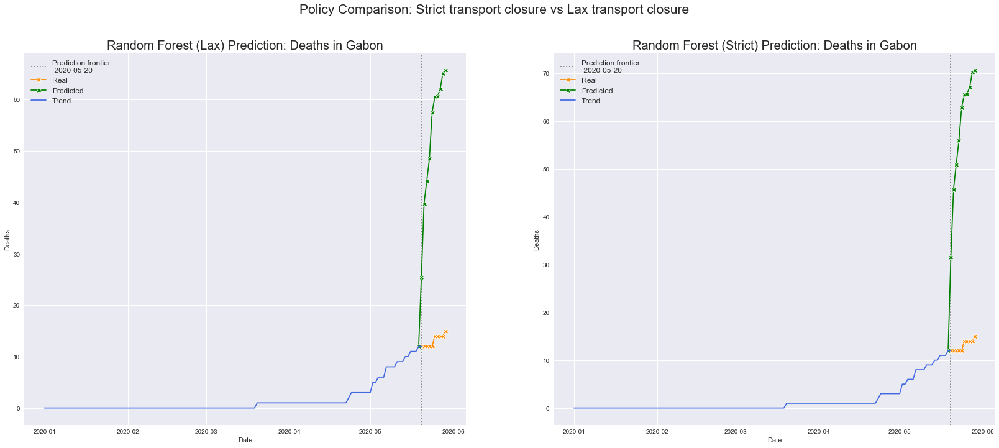

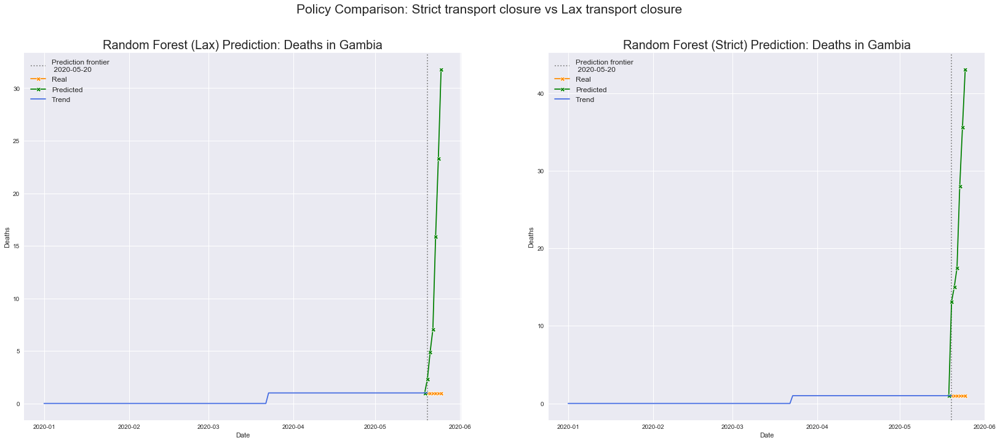

...

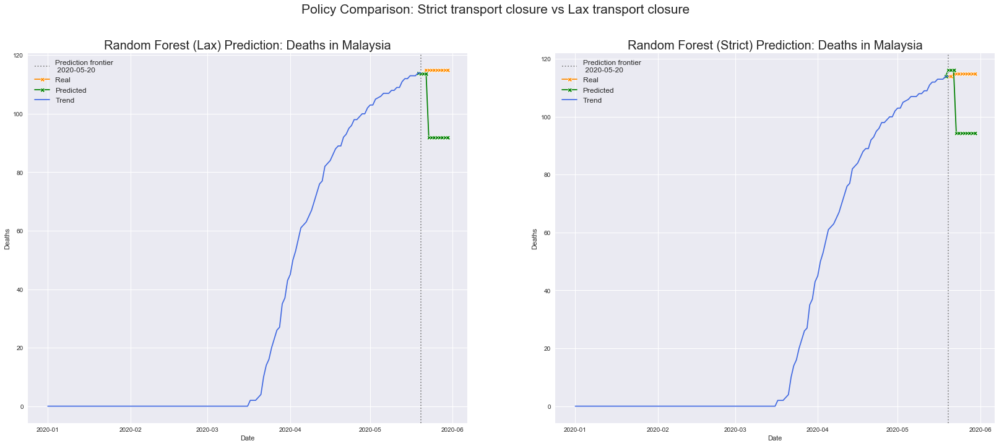

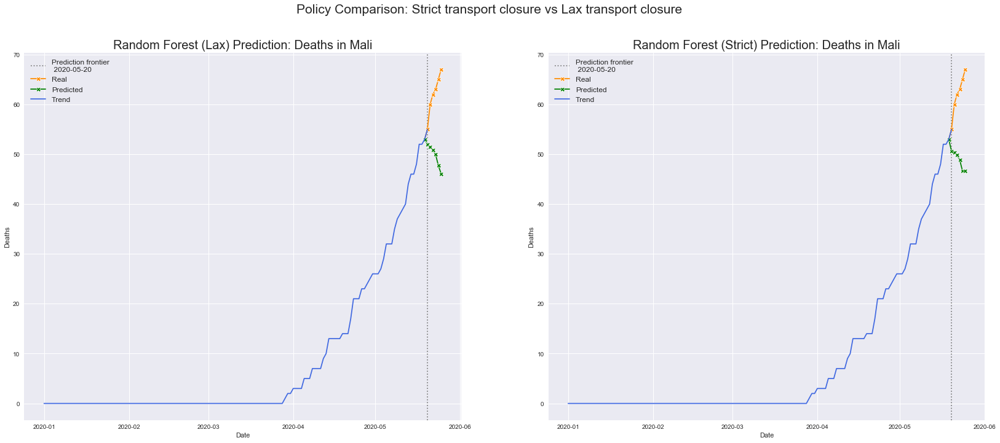

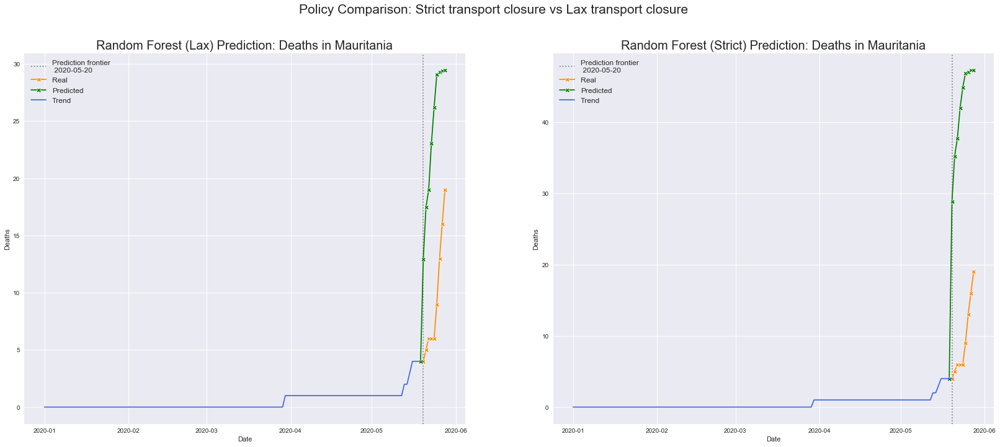

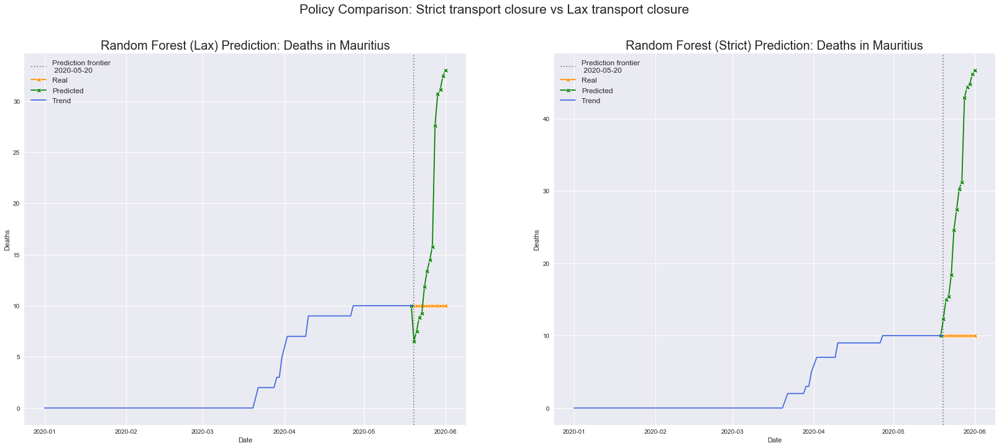

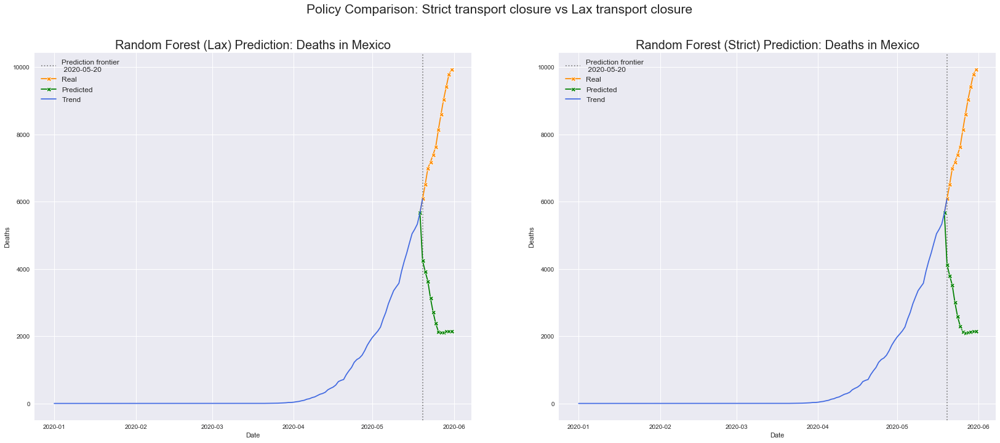

country missing: Moldova 





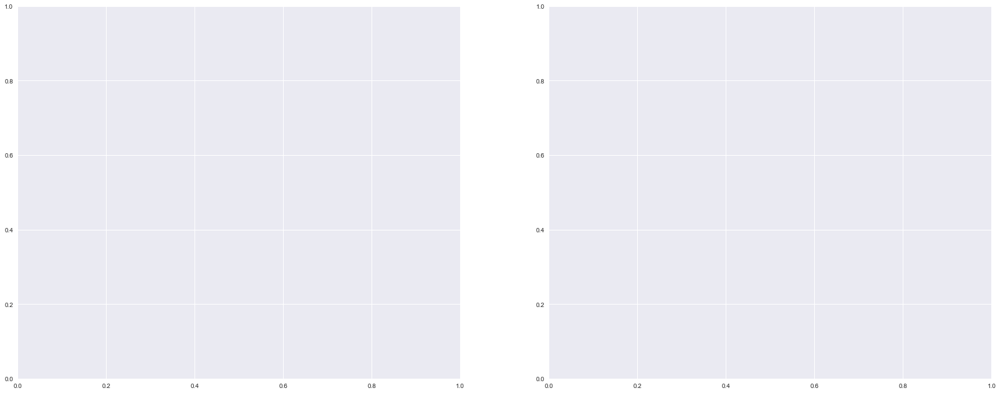

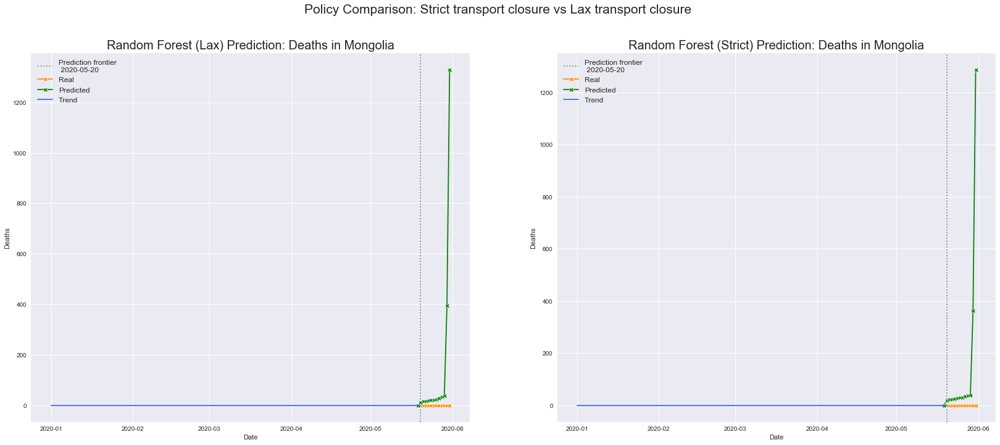

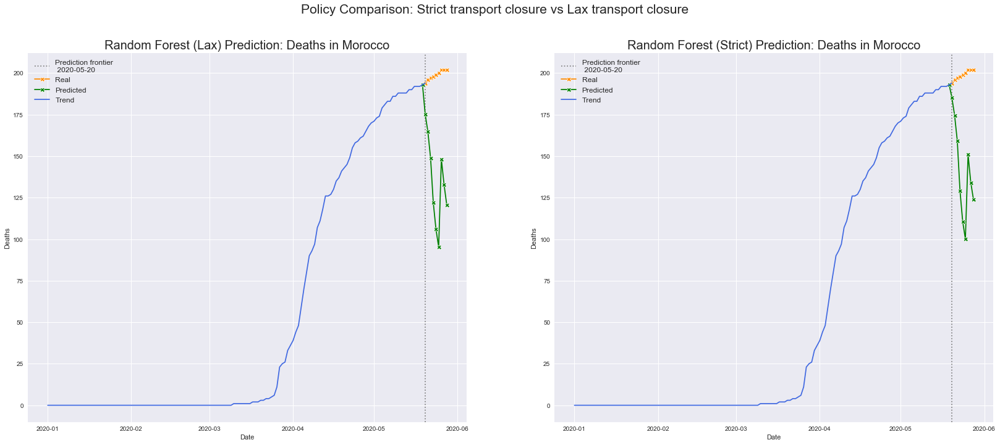

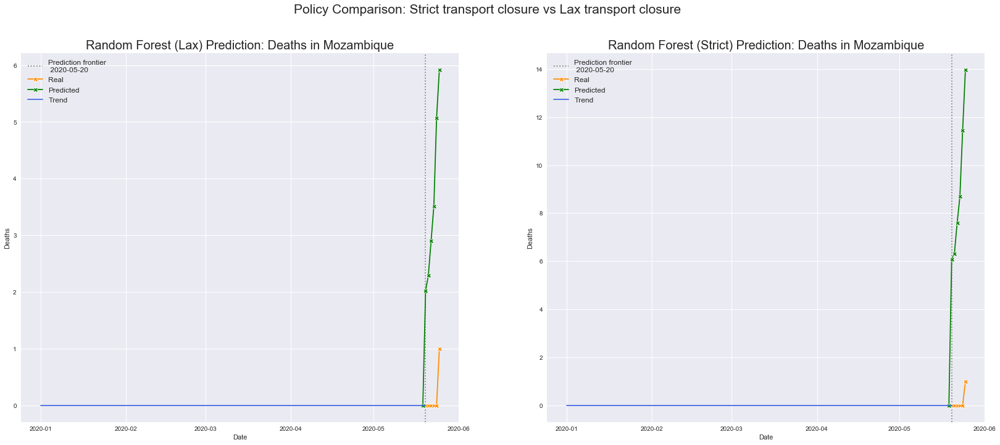

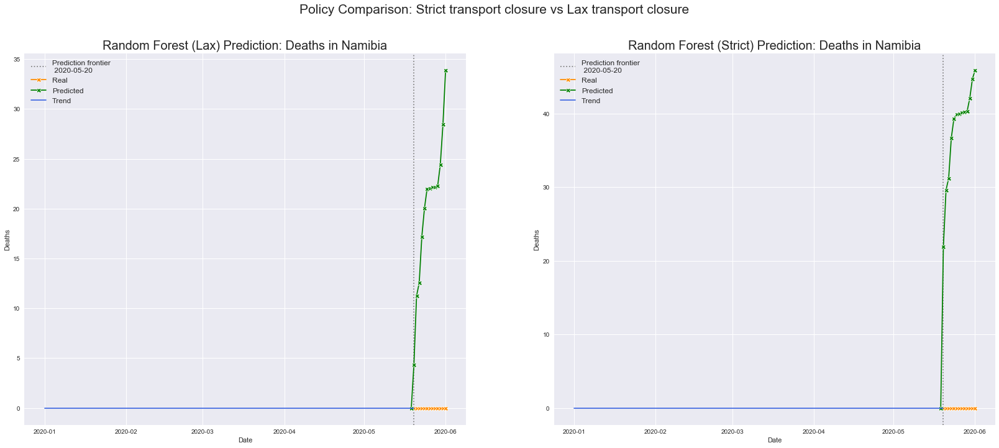

...

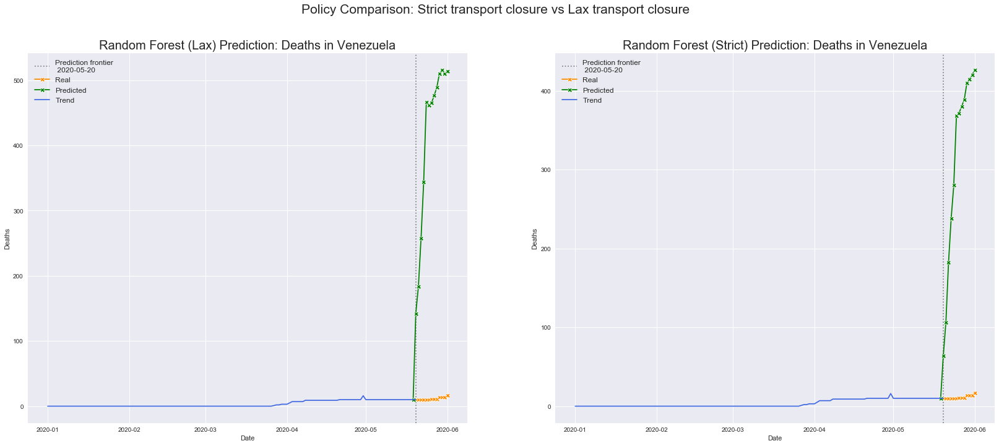

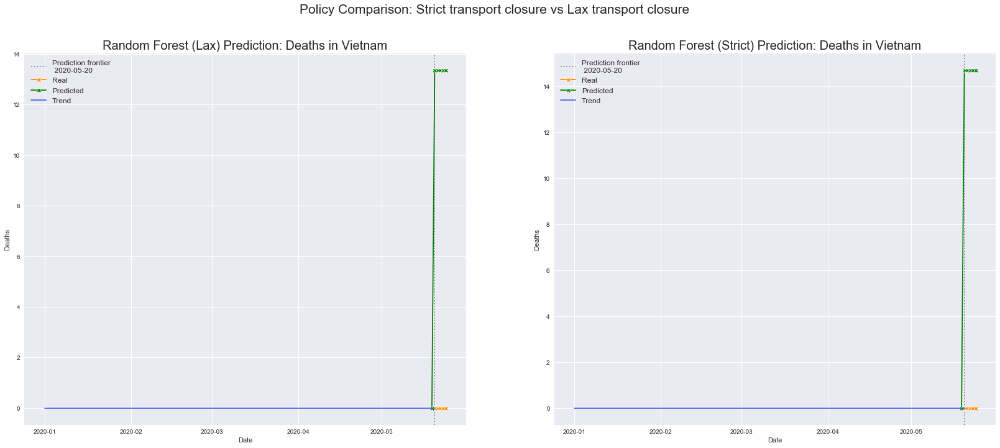

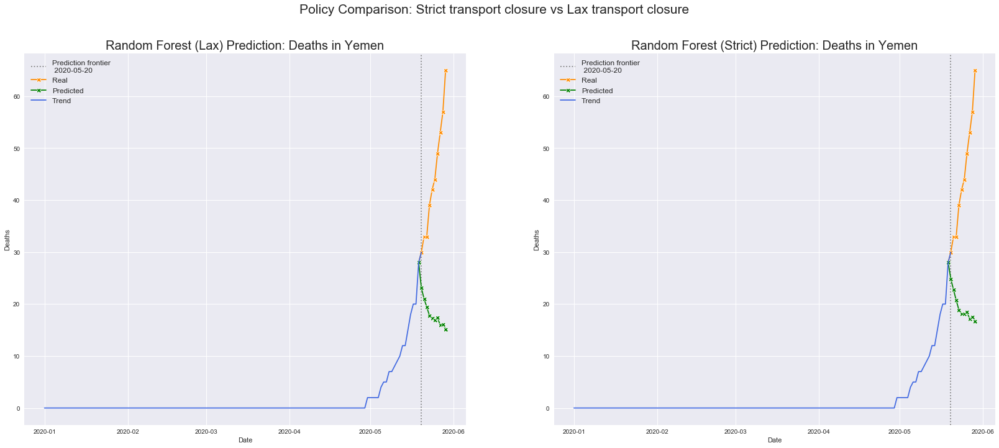

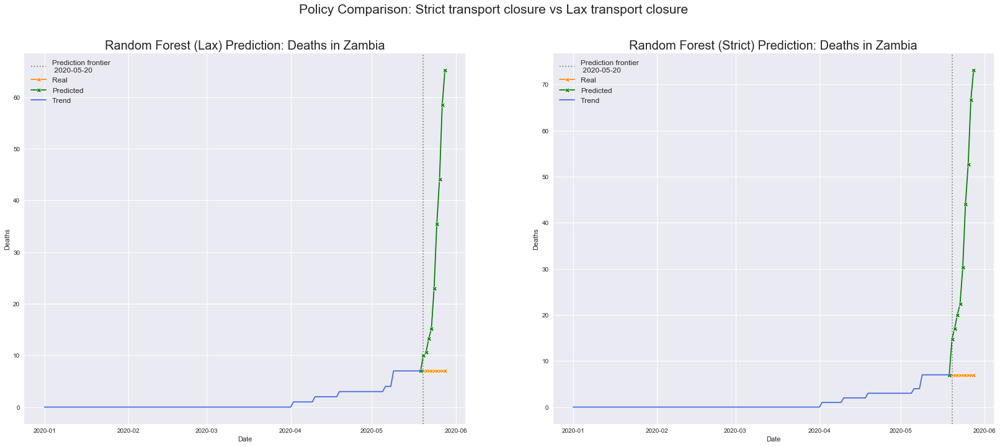

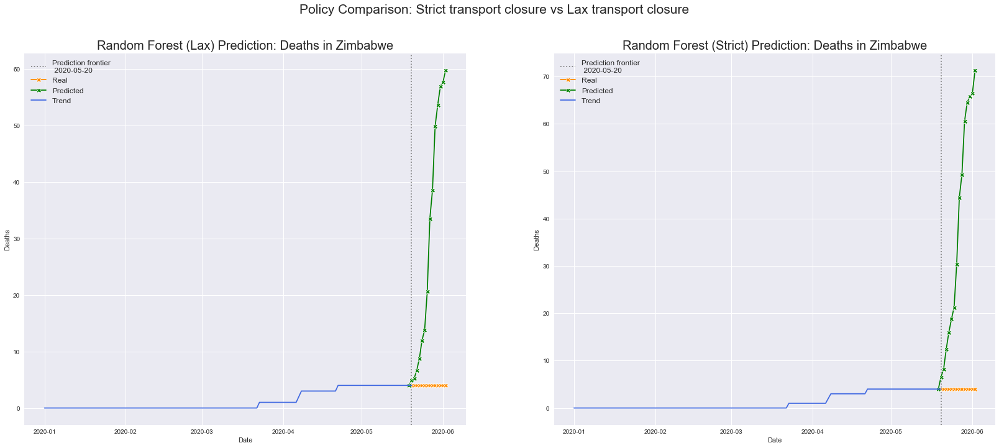

In [17]:
for country in all_data['Country'].unique():
    try:
        side_by_side(all_data, country, 'Deaths', ['Random Forest (Lax)', 'Random Forest (Strict)'], 
             death_lax, death_strict, save_output=False, 
             suptitle='Policy Comparison: Strict transport closure vs Lax transport closure')
    except:
        print('country missing:', country, '\n\n\n')

In [ ]:
predicted_vs_real(all_data, output, 'Lesotho', 'Confirmed Cases', logged=True)
predicted_vs_real(all_data, mlp, 'Lesotho', 'Confirmed Cases', logged=False, net=True)

In [ ]:
best_models = ['Bahrain', 'Belgium','Benin', 'China', 'Ecuador', 'Finland', 'France', 'Hungary', 'Iran', 'Lebanon', 'Mali', 'Moldova', 'Nicaragua', 'Pakistan', 'Philippines',\
               'South Africa', 'Ukraine', 'United Kingdom']
for country in best_models:
    predicted_vs_real(all_data, output, country, 'Confirmed Cases', logged=True)